In [141]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import random
cv2.ocl.setUseOpenCL(False)
import warnings
warnings.filterwarnings("ignore")


# Loading the images 

In [ ]:
# Load and Preprocess Images 
train_img = cv2.imread(r'C:\Users\ronjd\OneDrive\Desktop\project public repo\image stitching\unstitched\train.jpg')
train_img = cv2.cvtColor(train_img, cv2.COLOR_BGR2RGB)
train_gray = cv2.cvtColor(train_img, cv2.COLOR_RGB2GRAY)



In [143]:
query_img = cv2.imread(r'C:\Users\ronjd\OneDrive\Desktop\project public repo\image stitching\unstitched\query.jpg')
query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)
query_gray = cv2.cvtColor(query_img, cv2.COLOR_RGB2GRAY)

Text(0.5, 0, 'Train Image')

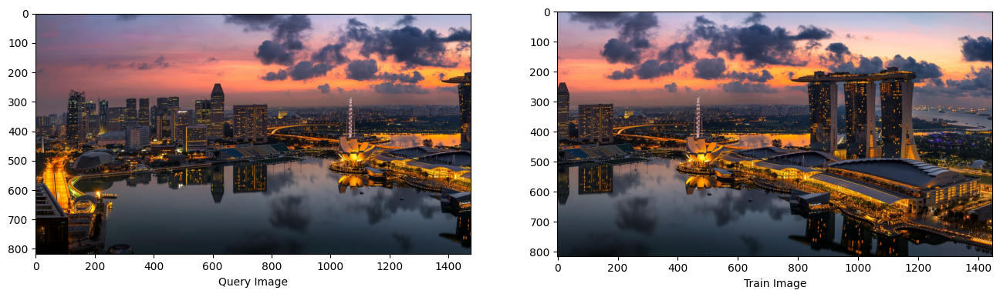

In [144]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 9))
ax1.imshow(query_img)
ax1.set_xlabel('Query Image')
ax2.imshow(train_img)
ax2.set_xlabel('Train Image')

# Preprocessing

In [145]:

# Function to detect Harris keypoints in a grayscale image
def detect_harris_keypoints(gray_img, block_size=2, ksize=3, k=0.04, threshold_ratio=0.01):
    # Compute the Harris corner response
    harris_response = cv2.cornerHarris(gray_img, block_size, ksize, k)
    harris_response = cv2.dilate(harris_response, None)
    # threshold for detecting strong corners
    threshold = threshold_ratio * harris_response.max()
    # Finding the  coordinates of corners above the threshold
    coords = np.argwhere(harris_response > threshold)
    keypoints = [cv2.KeyPoint(float(x), float(y), 3) for y, x in coords]
    return keypoints


In [146]:
# SIFT Descriptor Extraction at Harris Keypoints 
sift = cv2.SIFT_create()
query_kp = detect_harris_keypoints(query_gray)
train_kp = detect_harris_keypoints(train_gray)
query_kp, query_desc = sift.compute(query_gray, query_kp)
train_kp, train_desc = sift.compute(train_gray, train_kp)

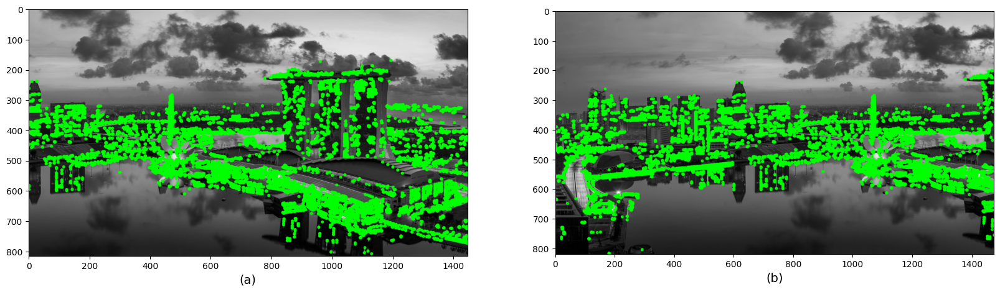

In [147]:
fig, (ax1, ax2) = plt.subplots(1, 2, constrained_layout = False, figsize=(20, 8))
ax1.imshow(cv2.drawKeypoints(train_gray,    train_kp, None, color=(0, 255, 0)))
ax1.set_xlabel('(a)', fontsize=14)
ax2.imshow(cv2.drawKeypoints(query_gray, query_kp, None, color=(0, 255, 0)))
ax2.set_xlabel('(b)', fontsize=14)

plt.show()

# Custom RANSAC With Affine Transform

In [148]:
# Custom RANSAC for Affine Transformation
def custom_ransac_affine(matches, kp1, kp2, threshold=3.0, iterations=300, seed=None):
    # random seed for reproducibility
    if seed is not None:
        random.seed(seed)
    
    
    best_inliers = []
    best_residuals = []
    best_M = None
    
    for _ in range(iterations):
        # Randomly sample 3 matches to estimate the affine transformation
        subset = random.sample(matches, 3)
        src_pts = np.float32([kp2[m.trainIdx].pt for m in subset]).reshape(-1, 2)
        dst_pts = np.float32([kp1[m.queryIdx].pt for m in subset]).reshape(-1, 2)
        M = cv2.getAffineTransform(src_pts, dst_pts)  #  affine transformation matrix

        # checking inliers and residuals
        inliers = []
        residuals = [] 
        for m in matches:
            pt_train = np.array(kp2[m.trainIdx].pt + (1,))  
            predicted = np.dot(M, pt_train)  
            actual = np.array(kp1[m.queryIdx].pt)  
            error = np.linalg.norm(predicted - actual)  # Compute Euclidean distance (residual)
            if error < threshold:  # Check if the match is an inlier
                inliers.append(m)
                residuals.append(error)

        # Update the best transformation if the current one has more inliers
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
            best_M = M
            best_residuals = residuals

    
    return best_M, best_inliers, best_residuals



# Matching the key points and stitching the images


In [149]:
# Distance Metrics 
def normalize_descriptors(desc):
    norms = np.linalg.norm(desc, axis=1, keepdims=True)
    return desc / (norms + 1e-8)

normalized_query = normalize_descriptors(query_desc)
normalized_train = normalize_descriptors(train_desc)


In [150]:
# Sample descriptors to speed up computation
query_sample_indices = np.random.choice(len(normalized_query), size=min(500, len(normalized_query)), replace=False)
train_sample_indices = np.random.choice(len(normalized_train), size=min(500, len(normalized_train)), replace=False)

## Threshold of 0.3

filtering the keypoints that have strong matches that are below 0.3 

In [151]:
#compute the euclidian distnce
matches = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.3:  # Filter for strong matches only
        matches.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))


In [152]:
matches = sorted(matches, key=lambda x: x.distance)

matches = matches[:100]
print("total number of matches:", len(matches))

total number of matches: 14


In [153]:
M_affine, inlier_matches,residuals = custom_ransac_affine(matches, query_kp, train_kp,seed=42)
print("Inliers:", len(inlier_matches))
print("Outliers:", len(matches) - len(inlier_matches))
avg_squared_residual = np.mean(np.square(residuals))
rmse = np.sqrt(np.mean(np.square(residuals)))
avg_residual = np.mean(residuals)
print("Average residual:", avg_residual)
print("RMSE:", rmse)
print("Average squared residual:", avg_squared_residual)
print("Best Affine Matrix (best_M):\n", M_affine)

Inliers: 14
Outliers: 0
Average residual: 1.0890685301591547
RMSE: 1.3584609382755954
Average squared residual: 1.845416120820611
Best Affine Matrix (best_M):
 [[ 9.99983932e-01 -4.85241898e-03  6.01818629e+02]
 [-3.29386057e-03  1.00525411e+00  1.81890194e+00]]


In [154]:
# Accuracy Score (Euclidean Distance) 
def compute_accuracy_score(matches, kp1, kp2, M):
    errors = []
    for m in matches:
        pt_train = np.array(kp2[m.trainIdx].pt + (1,))
        projected = np.dot(M, pt_train)
        target = np.array(kp1[m.queryIdx].pt)
        error = np.linalg.norm(projected - target)
        errors.append(error)
    return np.mean(errors)

accuracy_score = compute_accuracy_score(inlier_matches, query_kp, train_kp, M_affine)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 1.09 pixels


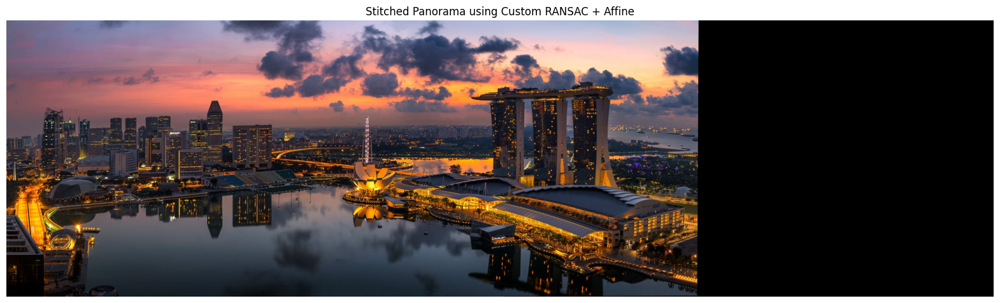

In [155]:
height, width = query_img.shape[:2]
warped_img = cv2.warpAffine(train_img, M_affine, (width + train_img.shape[1], height))
warped_img[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()



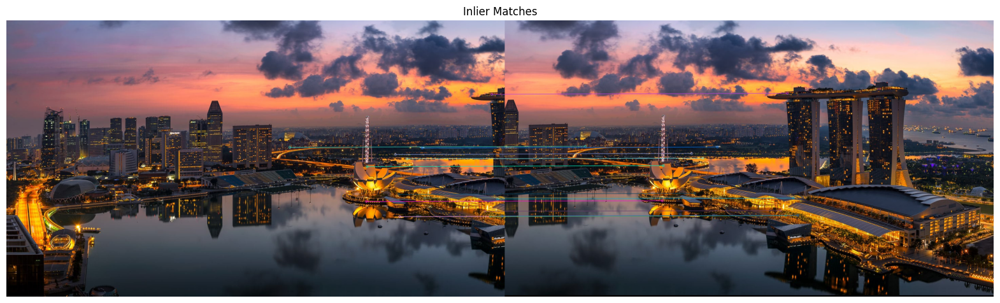

In [156]:
#  Inlier Matches plots
inlier_vis = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [157]:
iterations = [100, 300, 500, 1000, 1500]
avg_residuals = []
for i in iterations:
    M, inliers, residuals = custom_ransac_affine(matches, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    avg_residuals.append(np.mean(residuals))
    print(f"Iterations: {i}, Inliers: {len(inliers)}, Avg Residual: {np.mean(residuals):.2f}")
    


Iterations: 100, Inliers: 14, Avg Residual: 1.09
Iterations: 300, Inliers: 14, Avg Residual: 1.09
Iterations: 500, Inliers: 14, Avg Residual: 1.09
Iterations: 1000, Inliers: 14, Avg Residual: 1.09
Iterations: 1500, Inliers: 14, Avg Residual: 1.09


## Threshold of 0.5

In [158]:
#compute the euclidian distnce
matches2 = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.5:  
        matches2.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))


In [159]:
# matches in 100 points 
matches2 = sorted(matches2, key=lambda x: x.distance)

matches2 = matches2[:100]
print("total number of matches:", len(matches2))

total number of matches: 48


In [160]:
M_affine2, inlier_matches2,residuals2 = custom_ransac_affine(matches2, query_kp, train_kp, seed=42)
print("Inliers:", len(inlier_matches2))
print("Outliers:", len(matches2) - len(inlier_matches2))
avg_squared_residual2 = np.mean(np.square(residuals2))
rmse2 = np.sqrt(np.mean(np.square(residuals2)))
avg_residual2 = np.mean(residuals2)
print("Average residual:", avg_residual2)
print("RMSE:", rmse2)
print("Average squared residual:", avg_squared_residual2)
print("Best Affine Matrix (best_M):\n", M_affine2)


Inliers: 22
Outliers: 26
Average residual: 1.2367056671700134
RMSE: 1.4514693878598235
Average squared residual: 2.1067633838941706
Best Affine Matrix (best_M):
 [[1.00181897e+00 1.73235167e-03 5.97225552e+02]
 [2.34927739e-17 1.00000000e+00 2.00000000e+00]]


In [161]:
#  Accuracy Score (Euclidean Distance)


accuracy_score2 = compute_accuracy_score(inlier_matches2, query_kp, train_kp, M_affine2)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score2:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 1.24 pixels


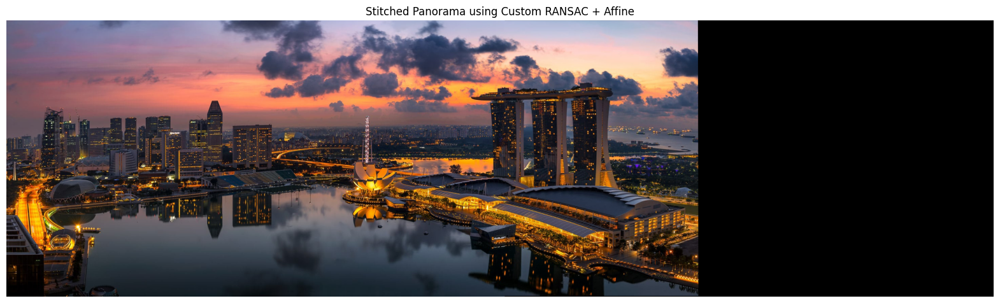

In [162]:
height, width = query_img.shape[:2]
warped_img2 = cv2.warpAffine(train_img, M_affine2, (width + train_img.shape[1], height))
warped_img2[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img2)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()

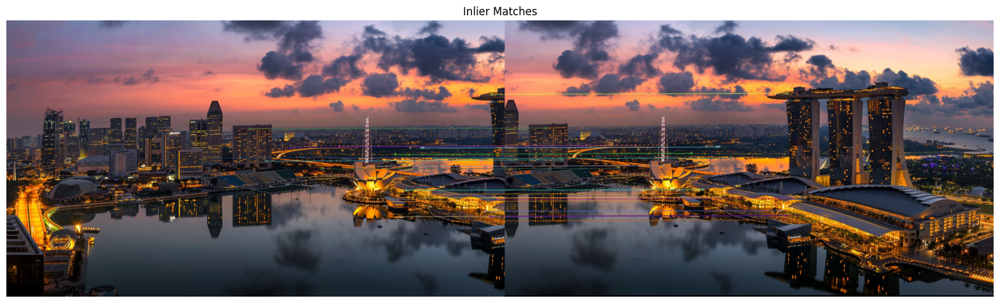

In [163]:
#  Inlier Matches 
inlier_vis2 = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches2, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis2)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [164]:
#tessting with different iterations
iterations = [100, 300, 500, 1000, 1500]
for i in iterations:
    M_2, inliers_2, residuals_2 = custom_ransac_affine(matches2, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    print(f"Iterations: {i}, Inliers: {len(inliers_2)}, Avg Residual: {np.mean(residuals_2):.2f}")




Iterations: 100, Inliers: 18, Avg Residual: 1.08
Iterations: 300, Inliers: 22, Avg Residual: 1.24
Iterations: 500, Inliers: 22, Avg Residual: 1.24
Iterations: 1000, Inliers: 22, Avg Residual: 1.24
Iterations: 1500, Inliers: 22, Avg Residual: 1.24


## Threshold of 0.7

In [165]:
#compute the euclidian distnce
matches3 = []
for i in query_sample_indices:
    dists = np.linalg.norm(normalized_train[train_sample_indices] - normalized_query[i], axis=1)
    best_j_local = np.argmin(dists)
    best_dist = dists[best_j_local]
    best_j = train_sample_indices[best_j_local]
    if best_dist < 0.7:  
        matches3.append(cv2.DMatch(_queryIdx=i, _trainIdx=best_j, _distance=best_dist))
    

In [166]:
matches3 = sorted(matches3, key=lambda x: x.distance)
print("total number of matches:", len(matches3))
matches3 = matches3[:100]
print("total number of matches:", len(matches3))

total number of matches: 353
total number of matches: 100


In [167]:
M_affine3, inlier_matches3,residuals3 = custom_ransac_affine(matches3, query_kp, train_kp,seed=42)
print("Inliers:", len(inlier_matches3))
print("Outliers:", len(matches3) - len(inlier_matches3))
avg_squared_residual3 = np.mean(np.square(residuals3))
rmse3 = np.sqrt(np.mean(np.square(residuals3)))
avg_residual3 = np.mean(residuals3)
print("Average residual:", avg_residual3)
print("RMSE:", rmse3)
print("Average squared residual:", avg_squared_residual3)
print("Best Affine Matrix (best_M):\n", M_affine3)


Inliers: 20
Outliers: 80
Average residual: 1.4260676300143402
RMSE: 1.6898370771419893
Average squared residual: 2.855549347283781
Best Affine Matrix (best_M):
 [[1.00003516e+00 2.60557685e-02 5.86549738e+02]
 [4.04374275e-03 9.96413376e-01 2.21987412e+00]]


In [168]:
#  Accuracy Score (Euclidean Distance)

accuracy_score3 = compute_accuracy_score(inlier_matches3, query_kp, train_kp, M_affine3)
print(f"Accuracy Score (Avg Euclidean Distance): {accuracy_score3:.2f} pixels")

Accuracy Score (Avg Euclidean Distance): 1.43 pixels


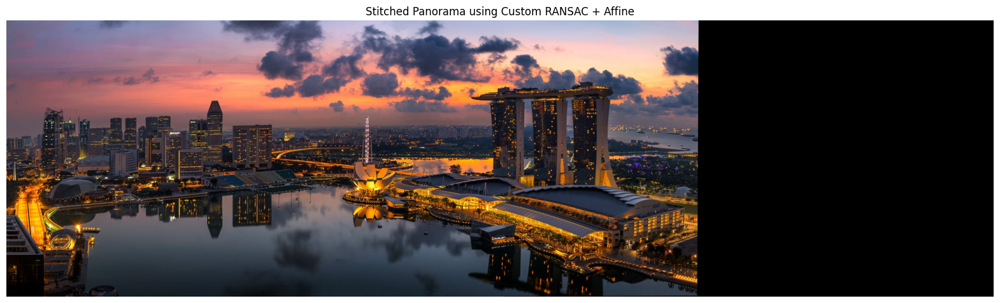

In [169]:
height, width = query_img.shape[:2]
warped_img3 = cv2.warpAffine(train_img, M_affine3, (width + train_img.shape[1], height))
warped_img3[0:height, 0:width] = query_img

plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Affine")
plt.show()

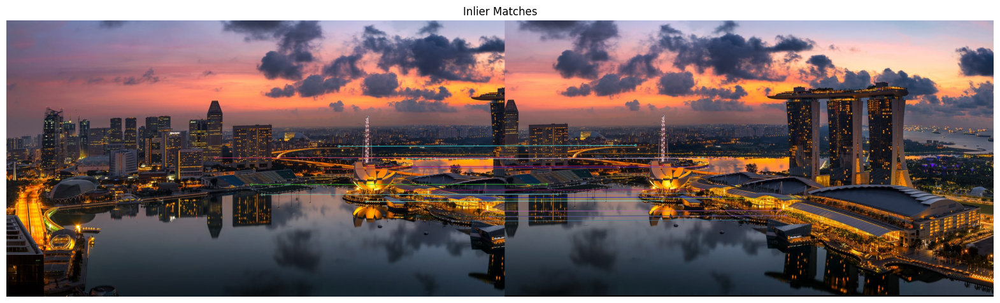

In [170]:
#  Inlier Matches plots
inlier_vis3 = cv2.drawMatches(query_img, query_kp, train_img, train_kp, inlier_matches3, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(20, 8))
plt.imshow(inlier_vis3)
plt.axis('off')
plt.title("Inlier Matches")
plt.show()

In [171]:
#tessting with different iterations
iterations = [100, 300, 500, 1000, 1500]
for i in iterations:
    M_3, inliers_3, residuals_3 = custom_ransac_affine(matches3, query_kp, train_kp, threshold=3.0, iterations=i, seed=42)
    print(f"Iterations: {i}, Inliers: {len(inliers_3)}, Avg Residual: {np.mean(residuals_3):.2f}")

Iterations: 100, Inliers: 19, Avg Residual: 1.35
Iterations: 300, Inliers: 20, Avg Residual: 1.43
Iterations: 500, Inliers: 20, Avg Residual: 1.43
Iterations: 1000, Inliers: 27, Avg Residual: 1.45
Iterations: 1500, Inliers: 27, Avg Residual: 1.45


## Homography initialization 

Transforming 2x3 matrix to 3x3 to use warptperspective and use homography for a proper stitch of the images even if the images are reversed 

In [172]:
# Converts a 2x3 affine matrix to a 3x3 homography matrix.
   
def affine_to_homography(affine_matrix):
    H = np.vstack([affine_matrix, [0, 0, 1]])
    return H


In [173]:
best_H = affine_to_homography(M_affine)
print("Homography Matrix (3x3):\n", best_H)


Homography Matrix (3x3):
 [[ 9.99983932e-01 -4.85241898e-03  6.01818629e+02]
 [-3.29386057e-03  1.00525411e+00  1.81890194e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [174]:

h1, w1 = query_img.shape[:2]
h2, w2 = train_img.shape[:2]

# Corners of train_img which is the image being warped
train_corners = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(train_corners, best_H)

# Also add corners of query_img which is the reference image
query_corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)

# Combining all corners to find final panorama bounds
all_corners = np.concatenate((warped_corners, query_corners), axis=0)
[x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

#  keeping  everything in positive space
translation = [-x_min, -y_min]
H_translation = np.array([
    [1, 0, translation[0]],
    [0, 1, translation[1]],
    [0, 0, 1]
])

# Warp train_img with updated homography
panorama_size = (x_max - x_min, y_max - y_min)
warped_img = cv2.warpPerspective(train_img, H_translation @ best_H, panorama_size)

warped_img[translation[1]:translation[1]+h1, translation[0]:translation[0]+w1] = query_img


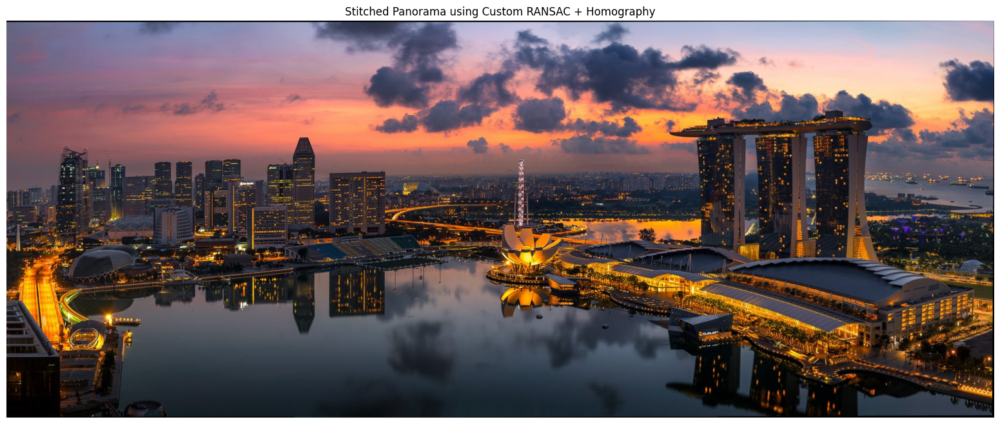

In [175]:
plt.figure(figsize=(20, 8))
plt.imshow(warped_img)
plt.axis('off')
plt.title("Stitched Panorama using Custom RANSAC + Homography")
plt.show()
